# JAAS 2019 - Procesamiento de Señales en Python
## Clase 2: Librerías para manipulación de señales

![](imagenes/workshop_logo_300x200.png)

## Índice
* [Matplotlib: implementación de gráficos de datos](#Matplotlib:-implementación-de-gráficos-de-datos)
    * [Primeros graficos](#Primeros-graficos)
    * [Formateo](#Formateo)
    * [Manejo de figuras](#Manejo-de-figuras)
    * [Agrupamiento y tipos de grafico](#Agrupamiento-y-tipos-de-gráfico)
    * [Acceso y modificacion de las propiedades](#Acceso-y-modificacion-de-las-propiedades)
    * [Contornos de igual nivel](#Contornos-de-igual-nivel)
* [Scipy: librería para procesamiento de señales](#Scipy:-librería-para-procesamiento-de-señales)
    * [Importando modulos de Scipy](#Importando-modulos-de-Scipy)
    * [Leer y escribir archivos WAV desde Scipy](#Leer-y-escribir-archivos-WAV-desde-Scipy)
    * [Leer y escribir archivos WAV desde PySoundfile](#Leer-y-escribir-archivos-WAV-desde-PySoundfile)
* [Analizando el espectro con la transformada rapida de Fourier](#Analizando-el-espectro-con-la-transformada-rapida-de-Fourier)
    * [Una primera aproximacion](#Una-primera-aproximacion)
    * [Aplicando una ventana temporal](#Aplicando-una-ventana-temporal)
* [Respuestas al impulso y convolucion](#Respuestas-al-impulso-y-convolucion)
* [Referencias](#Referencias)
* [Licencia](#Licencia)

## Matplotlib: implementación de gráficos de datos

[Matplotlib](https://matplotlib.org/) es una biblioteca de Python destinada a la producción de gráficas de alta calidad. 

![](imagenes/matplotlib_logo.png)

Puede ser utilizada en scripts, consolas interactivas y notebooks, particularmente Jupyter, como haremos en este curso.

Sin más preámbulo, ¡pongamos manos a la obra!

### Primeros graficos

Ya que estudiamos Ingeniería de Sonido, comenzaremos como no podía ser de otra manera, graficando señales de uso común. La forma estándar de utilizar `matplotlib`, o por lo menos la más didáctica, es a través del módulo `pyplot`.

In [1]:
import matplotlib.pyplot as plt

Con la siguiente línea "mágica" de comando, indicamos a Jupyter que muestre las gráficas junto con el código:

In [2]:
%matplotlib inline

Para más información sobre "comandos mágicos", ver [Built-in magic commands](https://ipython.org/ipython-doc/3/interactive/magics.html) en la documentación de IPython.

Si bien `inline` es el comportamiento por defecto, de todas formas, consideramos plausible aclararlo. Prosigamos.

Grafiquemos un escalón unitario. Una forma sencilla de hacerlo es como sigue.

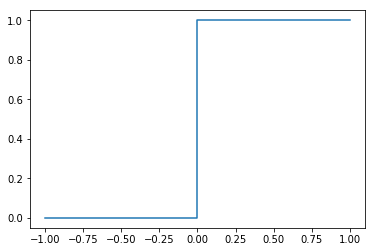

In [3]:
plt.plot( [-1, 0, 0, 1], [0, 0, 1, 1] )
plt.show()

La función `plot` toma dos vectores 'x' e 'y' de igual tamaño

\begin{align*}
    \mathbf{x} &= \begin{bmatrix} x_1 & x_2 & \cdots & x_N \end{bmatrix} \\
    \mathbf{y} &= \begin{bmatrix} y_1 & y_2 & \cdots & y_N \end{bmatrix}
\end{align*}

y    construye segmentos de recta en el plano cartesiano para unir  los puntos.

\begin{equation*}
    (x_1,y_1), (x_2,y_2), \dots (x_N,y_N)
\end{equation*}

Nótese que tales puntos coinciden con las columnas de la matriz resultante de apilar 'x' e 'y' como filas ( queda de $2 \times N$, o sea 2 filas y $N$ columnas).

En el caso del escalón unitario, lo que hicimos fue proveer los vectores

\begin{align*}
    \mathbf{x} &= \begin{bmatrix} -1 & 0 & 0 & 1 \end{bmatrix} \\
    \mathbf{y} &= \begin{bmatrix} \phantom{-}0 & 0 & 1 & 1 \end{bmatrix}
\end{align*}

de forma tal que `plot` construyó la poligonal a partir de los puntos


\begin{equation*}
    (-1,0),(0,0),(0,1),(1,1)
\end{equation*}

Una vez ejecutado `plot`, se instancia la clase `Line2D` de `matplotlib.lines` para utilizarla como contenedor de la poligonal, y se la guarda en un espacio de memoria. El comando `show`, invocado justo después de `plot`,  genera un dibujo con el objeto `Line2D` almacenado.

El comando `plot` puede utilizarse dando **y** como argumento único.


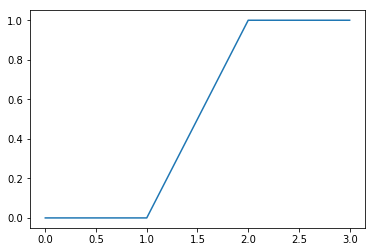

In [4]:
plt.plot([0, 0, 1, 1])
plt.show()

Los puntos que se unieron son:

\begin{equation*}
    (0,0), (1,0), (2,1), (3,1)
\end{equation*}

Observemos que los valores de abscisa, correspondientes a los valores de ordenada $\mathbf{y} = \begin{bmatrix} 0 & 0 & 1 & 1 \end{bmatrix}$ proporcionados al comando, quedaron $\mathbf{x} = \begin{bmatrix} 0 & 1 & 2 & 3 \end{bmatrix}$. 

En general, si ejecutamos `plot(y)` con $\mathbf{y} = \begin{bmatrix} y_1 & y_2 & \cdots & y_N \end{bmatrix}$ un vector cualquiera, `pyplot` construirá un $\mathbf{x} = \begin{bmatrix} 0 & 1 & \cdots & N-1 \end{bmatrix}$ automáticamente para representarlo en el plano.

"Elevemos la apuesta" y tratemos de graficar una función trigonométrica (vieja conocida). No tiene sentido tratar de realizar el proceso definiendo los vectores 'x' e 'y', como hicimos recién. Utilizaremos `numpy` para generar vectores dinámicamente, ahorrándonos trabajo.

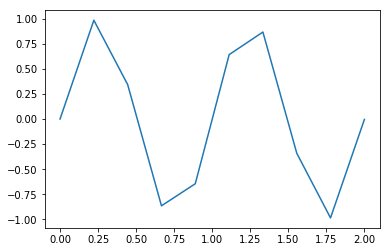

In [5]:
import numpy as np

x = np.linspace(0, 2, 10, dtype = np.float16)
y = np.sin(2 * np.pi * x) 

plt.plot(x, y)
plt.show()

El resultado es espantoso. Esto se debe a que  tenemos sólo 10&nbsp;muestras del eje *x*.

El comando `linspace` toma un determinado intervalo de números reales, en este caso el $[0, 2] \in \mathbb{R}$, y lo divide de forma equiespaciada en  10 elementos. En otras palabras, produce una partición regular 

\begin{equation*}
    \mathcal{P}\left\{ [0,2], 10 \right\} = \left[ \tfrac{2i}{9} : i = 0,1,2,\dots 9 \right] = \begin{bmatrix} 0 & \frac{2}{9} & \frac{4}{9} & \cdots & 2 \end{bmatrix}
\end{equation*}

en general, dado un intervalo de tiempo cualquiera $[t_1,t_2]$ el comando `linspace(t1, t2, N)` generará la siguiente partición del intervalo 

\begin{equation*}
    \mathcal{P}\left\{ [t_1,t_2], N \right\} = \left[ t_1 + \left(t_2-t_1\right) \cdot \frac{i}{N-1} : i = 0,1,2,\dots N-1 \right] = \begin{bmatrix} t_1 & t_1 + \left(t_2-t_1\right) \cdot \frac{1}{N-1} & t_1 + \left(t_2-t_1\right) \cdot \frac{2}{N-1} & \cdots & t_2 \end{bmatrix}
\end{equation*}

O sea que mejoraremos la resolución en tiempo  aumentando *N* (y por lo tanto, mejorará el dibujo, pues la curva no es otra cosa que la gráfica de una función 'y' dependiendo de 'x'). Hecho destacable de la informática: la computadora no maneja el continuo y conecuentemente discretiza, es decir,  todo aquello percibido como "curva", no es más que un conjunto de aproximaciones poligonales.

En nuestro caso, la poligonal se parece aceptablemente a una curva sinsuoide a partir de $N=50$.

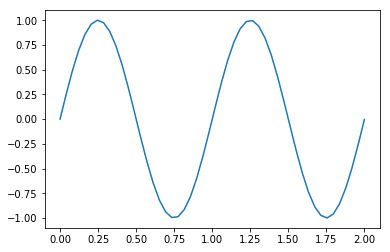

In [6]:
x = np.linspace(0, 2, 50, dtype = np.float16) 
y = np.sin(2 * np.pi * x) 

plt.plot(x, y)
plt.show()

¡Mucho mejor!

Para superponer otras gráficas encima de la que acabamos de hacer, basta ejecutar tantas veces como sea necesario el comando `plot` antes de `show`. Ejemplo:

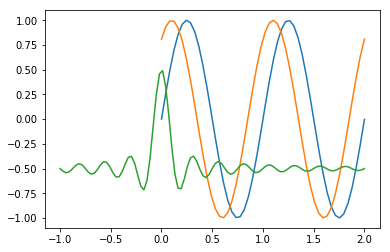

In [7]:
y2 = np.cos(2 * np.pi * (x - 0.1))

x3 = np.linspace(-1, 2, 99, dtype = np.float16) # tip: le dejamos 99 elementos para que el vector no contenga 0...
y3 = np.sin(8 * np.pi * x3) / (8 * np.pi * x3) - 0.5 # ... ¡así podemos dividir por x3!

plt.plot(x, y)
plt.plot(x, y2)
plt.plot(x3, y3)

plt.show()

> Otra forma de graficar varias curvas simultáneamente con `plot` es proporcionando tantos pares de vectores como curvas requiramos, es decir si **x1, y1** son los vectores que contienen los puntos de la primer poligonal, **x2, y2** los de la segunda, y siguiendo, **xN,yN** los de la *N*-ésima, entonces
>
> `plt.plot(x1, y1, x2, y2, ... xN, yN)`
>
> en el ejemplo aquí abordado, quedaría
>
> `plt.plot(x, y, x, y2, x3, y3)`
>
> ¡compruebe que da igual! Y no diga que no le avisamos.

### Formateo

Agregaremos algunas cosas, para que se vea todo más bonito:

* una grilla, con `grid(True)`;
* título al gráfico con `title`;
* nombres a los ejes `x` e `y` con `xlabel`, `ylabel` respectivamente.

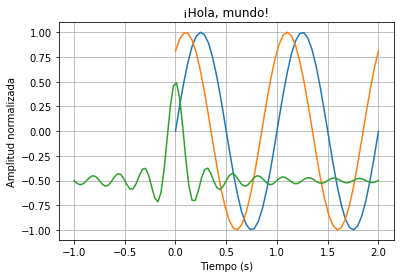

In [8]:
plt.plot(x, y)
plt.plot(x, y2)
plt.plot(x3, y3)

# "Embellecimiento"
plt.grid(True)
plt.title('¡Hola, mundo!')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud normalizada')

plt.show()

Ahora, demos nombres y estilo a cada una de las curvas. Construyamos también una leyenda para poder identificarlas. Los nombres pueden asignarse con el atributo `label` de cada `plot`, los estilos con atributos como `color`, `linewidth` y `linestyle`, mientras que la leyenda se muestra con el comando `legend`.

> **Nota:** El comando `plot` consta de innumerables opciones que no serán particularmente tratadas en este curso. Ante la duda, siempre podrá consultar la [documentación online de Matplotlib](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) o bien, ejecutar `help(plt.plot)` en una consola.

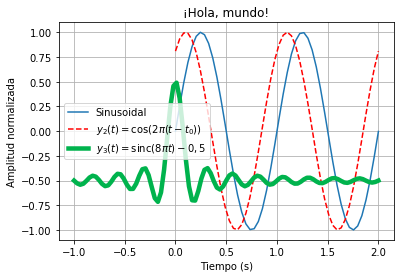

In [9]:
plt.plot(x, y, label='Sinusoidal') # Nombramos cada curva con el atributo label
plt.plot(
    x, y2,
    label='$ y_2(t) = \cos(2\pi(t-t_0))$ ', # podemos usar TeX escribiendo entre signos $
    color='r',     # asignamos el color rojo
    linestyle='--' # trazo de línea interrumpido
)
plt.plot(
    x3, y3,
    label='$ y_3(t) = \mathrm{sinc}(8\pi t) - 0,5$',
    color=(0, 0.7, 0.3), # podemos especificar el color mediante ternas (rojo, verde, azul)
    linewidth=4.5          # grosor igual a 4.5
)

plt.grid(True)
plt.title('¡Hola, mundo!')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud normalizada')

plt.legend() # esta sentencia muestra la lista de etiquetas cargadas anteriormente con label

plt.show()

La leyenda oculta parte del gráfico. Esto sucede porque no hay más espacio en el mismo. La solución es darle más espacio, para ubicar correctamente dicha leyenda.

Para esto emplearemos `ylim` especificando el intervalo de ordenadas que deseemos visualizar. En este caso, bastará con extender superiormente al intervalo, tomando p.&nbsp;ej. el $[-1,5; 2]$.

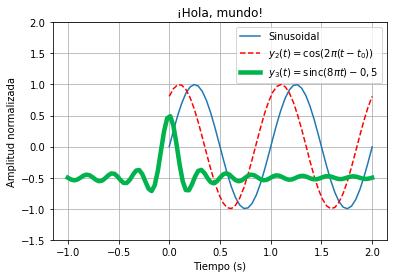

In [10]:
plt.plot(x, y, label='Sinusoidal')
plt.plot(x, y2, label='$ y_2(t) = \cos(2\pi(t-t_0))$ ', color='r', linestyle='--')
plt.plot(x3, y3, label='$ y_3(t) = \mathrm{sinc}(8\pi t) - 0,5 $', color=(0, 0.7, 0.3), linewidth=4.5)

plt.grid(True)
plt.title('¡Hola, mundo!')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud normalizada')

plt.ylim(-1.5, 2)

plt.legend()

plt.show()


### Manejo de figuras
Separemos las gráficas anteriores en figuras diferentes. El proceso es tan sencillo como llamar al comando `figure` por cada una que necesitemos.

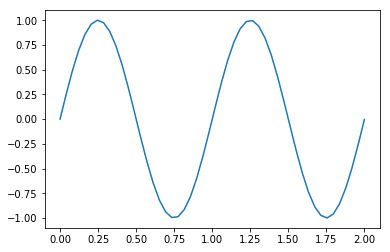

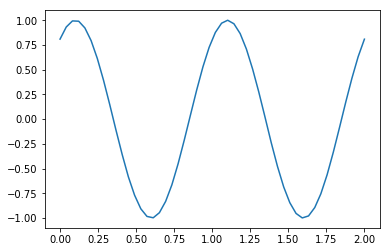

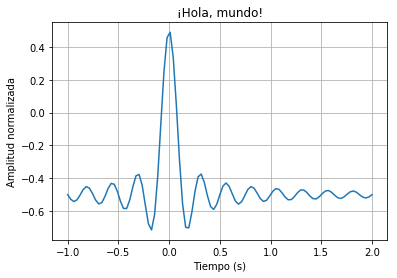

In [11]:
plt.figure()
plt.plot(x, y)

plt.figure()
plt.plot(x, y2)

plt.figure()
plt.plot(x3, y3)

plt.grid(True)
plt.title('¡Hola, mundo!')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud normalizada')

plt.show()

## Scipy: librería para procesamiento de señales

Scipy es una librería del paquete llamado con el mismo nombre. Está diseñada para trabajar en conjunto con Numpy, aplicando procesos sobre señales representadas por arrays.

Scipy está estructurada en forma de módulos, dentro de los cuales se encuentran distintas funciones específicas. Podemos ver la  lista completa de módulos en la [documentación online](https://docs.scipy.org/doc/scipy/reference/api.html) que nos ofrecen. O podemos desplazarnos en esta página y verla a continuación...

![](imagenes/modulos_scipy.png)

Los módulos que vamos a tratar en este curso (y, en general, los que más nos interesan para procesamiento de señales de audio) son :

 * `scipy.io`: Contiene funciones para procesamiento de archivos en varios formatos. En particular vamos a explorar los submódulos *scipy.io.matlab* y *scipy.io.wavfile*.
 * `scipy.fftpack`: Contiene implementaciones de la transformada rápida de Fourier, y también de la transformada de Hilbert.
 * `scipy.signal`: Contiene implementaciones de técnicas destinadas al procesamiento de señales. Es el paquete que tiene toda la diversión, ya que podremos generar distintas formas de onda, diseñar filtros y aplicar convolución de señales.

### Importando modulos de Scipy

La librería Scipy se importa de a módulos, es decir que para importar correctamente, debemos ingresar `import scipy.modulo` reemplazando la última palabra por el nombre del módulo que vamos a utilizar. Podemos pensar que ingresando `import scipy` importaría todos los módulos, pero sólo se importan funciones pertenecientes al paquete Numpy.

### Leer y escribir archivos WAV desde Scipy 

El submódulo `wavfile` contiene las funciones  que permiten leer y escribir archivos de audio. En el primer caso, la información contenida en el archivo *.wav* es convertida en un array de Numpy. En el segundo, se construye un archivo *.wav* a partir de un array.

Para importar el módulo correspondiente, podemos proceder de la siguiente forma:

In [12]:
import scipy.io.wavfile as spwav
import numpy as np # también importamos numpy siempre que trabajemos con scipy

Para leer archivos de audio, utilizamos la función `read`, la cual nos devuelve la frecuencia de muestreo y los valores de las muestras de la señal en forma de array. Dentro de la carpeta de la clase se encuentra la carpeta audio, vamos a abrir el archivo 'clarinete.wav' (extraído del sitio [**OpenAirLib**](http://www.openairlib.net/)) contenido en la misma:

In [13]:
sr, signal = spwav.read("clarinete.wav")

## Aplicación de FFT

## Analizando el espectro con la transformada rapida de Fourier

![](imagenes/fast-fourier.png)

Para analizar el espectro de la señal es posible implementar el algoritmo conocido como **FFT (Fast Fourier Transform)**. El mismo aplica la Transformada Discreta de Fourier (DFT), optimizando la velocidad del cálculo (para ver mas información sobre la teoría relativa a la DFT hacer clic en el [siguiente enlace](https://ccrma.stanford.edu/workshops/cm2007/topics/clases/PDFs/05fourier_handout.pdf)). 
Gracias a ella es posible el análisis de espectro en tiempo real.
La misma realiza la siguiente transformación sobre una señal discreta (y aperiódica) representada por `x[0], x[1], x[2], ... , x[n]` muestras:

\begin{equation*}
    X[k] = \sum_{n=0}^{N-1} x[n] \cdot e^{-j \cdot 2\pi \cdot (\frac{kn}{N})} 
\end{equation*}

Cuyo dominio es $k \in [0,N-1]$, con N igual a la cantidad de muestras sobre la que aplicaremos transformación. Puede ser la señal completa, o un fragmento de la señal.

Su parte exponencial puede escribirse también como:

\begin{equation*}
    e^{-j \cdot 2\pi \cdot (\frac{kn}{N})} = \cos(2\pi\cdot \frac{kn}{N}) - j\sin(2\pi\cdot \frac{kn}{N})
\end{equation*}

Por otro lado, podemos aplicar la transformada inversa (IFFT) para obtener una señal en el dominio del tiempo a partir de su espectro:

\begin{equation*}
    x[n] = \frac{1}{N}\sum_{k=0}^{N-1} y[k] \cdot e^{j \cdot 2\pi \cdot (\frac{kn}{N})}
\end{equation*}

> **Nota**: Recordemos siempre la distinción entre DFT y FFT. La primera es la transformada de Fourier en sí, mientras que la FFT es sólo un método de calcularla acelerando el proceso de cálculo en sistemas computaciones.

### Una primera aproximacion

Para importar los módulos de Scipy necesarios para la implementación de estos algoritmos, procedemos de la siguiente manera:

In [14]:
# importamos los módulos para aplicar la FFT y su inversa 
from scipy.fftpack import fft as spfft
from scipy.fftpack import fft as spifft

Las funciones importadas aplican la transformada y su inversa respectivamente. Su implementación es tan simple como llamarla e indicar la señal a la que queremos modificar. En este caso, lo hacemos de la siguiente manera: `spfft(señal)`.

In [15]:
espectro_sint = spfft(signal) # obtenemos el espectro de la señal sintetizada

espectro_sint[15], espectro_sint.dtype # valor del elemento [15] y formato del array

((-19716.93004644438-60049.727651481786j), dtype('complex128'))

In [16]:
espectro_sint.size

1397573

Analicemos un poco lo que obtuvimos, a partir de la expresión matemática de la FFT. Dijimos que $k \in [0,N-1]$, siendo N igual al número de muestras tomadas para realizar la transformada. En este caso, analizamos la señal completa, por lo que $N = frecuencia\ de\ muestreo [Hz]\cdot duracion[seg]$, lo que da 48000 muestras. Por otra parte, los valores de $X[k]$ son números complejos, es decir, que tienen una magnitud y una fase.

Los valores de k aún no representan valores de frecuencia. Quedan definidos en el rango $[0, 48000-1]$, por lo que hay que modificar este rango si queremos representar la señal correctamente.

Obviamente, nos conviene guardar el resultado en un array para poder analizarlo posteriormente. Por ejemplo, podemos trazar un gráfico del espectro. Podemos visualizar el valor absoluto, que representará la magnitud, para ver la distribución energética a lo largo del dominio de la frecuencia.

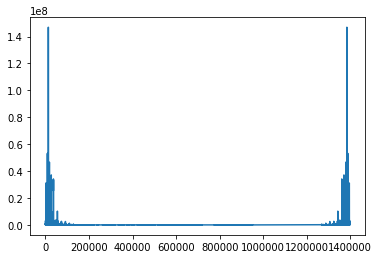

In [17]:
import matplotlib.pyplot as plt

plt.plot(np.abs(espectro_sint))
plt.show()

Este gráfico no nos muestra de forma clara la información que queremos ver. En principio se puede notar que aparecen dos puntos de mayor amplitud que, por conocer la señal previamente, podemos afirmar que representan la energía presente en las frecuencias de 50 Hz y 440 Hz. De todas formas, es difícil ubicarlos en el eje de la frecuencia; y además, aparecen espejados hacia la derecha del gráfico. Lo que sucede es que, por defecto, el espectro completo muestra las frecuencias positivas en la mitad izquierda del gráfico y de izquierda a derecha. Por otro lado, el espectro negativo se muestra espejado (como debe ser) pero de derecha a izquierda, del lado derecho del gráfico. Por último, todavía no vemos valores de frecuencia en el eje de abscisas. Lo que tenemos bien podría ser equivalente a la famosa función `cat`.

![](imagenes/catgraph.png)

En Scipy podemos utilizar `fftshift` para reacomodar el array que representa el espectro de la señal de manera tal que muestre los valores de frecuencia en un continuo desde los más negativos hasta los positivos, con el cero en el centro. Esta vez veremos un espectro espejado, más acorde a lo que estamos acostumbrados a ver. De todas formas, todavía quedan cosas para hacer antes de tener un gráfico correcto.

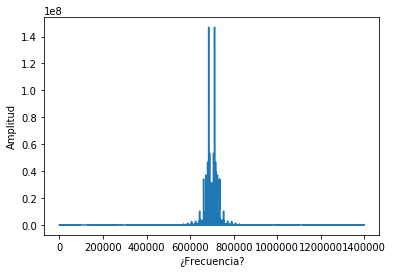

In [18]:
from scipy.fftpack import fftshift as spshift

plt.plot(np.abs(spshift(espectro_sint)))
plt.xlabel('¿Frecuencia?')
plt.ylabel('Amplitud')
plt.show()

Si bien ahora tenemos el cero en el centro del gráfico, los índices para el eje de frecuencia son incorrectos, comenzando desde cero para la frecuencia más negativa y con un rango de valores que no tiene que ver con el ancho de banda representado. Nos quedan por hacer dos cosas: 
 * Descartar la parte negativa del espectro y quedarnos con los valores positivos hasta la frecuencia de Nyquist
 * Redefinir el rango de las frecuencias positivas para que todas las muestras caigan dentro del ancho de banda.

A continuación, creamos un array `xfrec` para representar los valores de frecuencia a partir del cero, hasta la frecuencia de Nyquist, con N/2 cantidad de elementos. Con esto, tendremos nuestro eje de frecuencia correctamente definido entre los valores de interés.

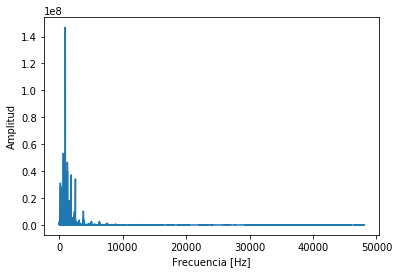

In [19]:
N = len(signal) # número de muestras de la señal
f_nyq = sr/2 # frecuencia de Nyquist

# vector para el eje de la frecuencia
xfrec = np.linspace(0, f_nyq, N//2) # atentos a este truco: a//b me devuelve un entero

# ahora grafico a partir del vector creado
plt.plot(xfrec, np.abs(espectro_sint[0:N//2]))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.show()

Ahora tenemos un gráfico correcto. Podemos asignar escalas logarítmicas para los ejes y agregar una grilla para visualizar mejor los datos. También normalizamos la amplitud (esto nos va a servir más adelante, cuando apliquemos la transformada inversa).

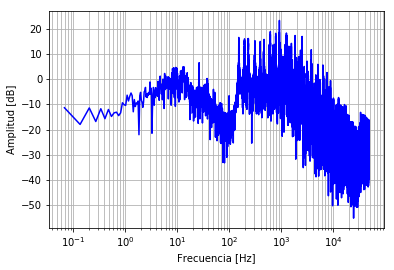

In [20]:
# semilogx es el equivalente a a plot, pero con eje de abscisas en escala logarítmica
# 2/N es el factor que multiplica a cada elemento para normalizar los valores de amplitud
# Luego se aplica 10log(Xnorm[k]) para expresar la amplitud en dB.

plt.semilogx(xfrec[1:N//2], 10*np.log10(2/N*np.abs(espectro_sint[1:N//2])), '-b')
plt.grid(which='both')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud [dB]')
plt.show()

## Respuestas al impulso y convolucion

La operación de convolución es otra forma de filtrar señales, en este caso a partir de la respuesta del impulso a un sistema. Obviamente, Scipy nos da herramientas para implementarla. Recordemos un poco la ecuación que define a la convolución en tiempo discreto:

\begin{equation*}
    y[n] = x[n] * h[n]
\end{equation*}

Convolucionar dos señales equivale a desplazar una sobre la otra, multiplicandolas en cada paso del desplazamiento. Luego, la sumatoria de estos productos es la salida del sistema para la posición específica.

\begin{equation*}
    x[n] * h[n] = \sum^{\infty}_{k=-\infty} x[k] \cdot h[n-k]
\end{equation*}

Una forma visual de comprenderla:

![](imagenes/convolucion.png)

Pero algo mucho más sencillo de hacer es la convolución en el dominio de la frecuencia. En este caso, basta con multiplicar las transformadas de las dos señales elemento a elemento, y luego aplicar la transformada inversa:

\begin{equation*}
    x[n] * y[n] = \mathcal{F}^{-1} (X[k] \cdot Y[k])
\end{equation*}


Tenemos la posibilidad de aplicar la convolución en cualquiera de los dos dominios. El paquete `signal` posee dos funciones: `convolve` y `fftconvolve`.
El segundo método aplica una FFT a ambas señales y las multiplica en el dominio de la frecuencia. En general, esto resulta un cálculo mucho más veloz, excepto en casos en los que se tienen señales de unas pocas muestras. Si pensamos en respuestas al impulso reales o sintetizadas, tenemos vectores lo suficientemente largos como para justificar la multiplicación en frecuencia.

De todas formas, podremos utilizar `convolve` para operar por medio del método más conveniente, ya que es capaz de llamar a la función `fftconvolve` si la utilización de la FFT resuelve el cálculo en menor tiempo. 

Para implementarla, los argumentos de entrada son las dos señales a convolucionar, $x[n]$ y $h[n]$, que representan la entrada del sistema y su respuesta al impulso. Veamos un ejemplo.

In [21]:
x_ent = np.ones(5, dtype=np.int8)
h_sist = np.arange(3, dtype=np.int8)

x_ent, h_sist

(array([1, 1, 1, 1, 1], dtype=int8), array([0, 1, 2], dtype=int8))

In [22]:
import time
import scipy.signal as spsignal
import scipy.io.wavfile as sf

In [23]:
# intercambiemos los modos para ver los resultados
metodo = ['auto', 'direct', 'fft']

inicio = time.time()

y_out = spsignal.convolve(x_ent, h_sist) # method = 'auto' por defecto 

fin = time.time()
delay_sum = fin - inicio

print(np.round(delay_sum, 4), 'ms')

0.0002 ms


<StemContainer object of 3 artists>

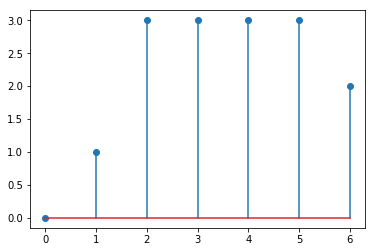

In [24]:
plt.stem(y_out)

Ahora implementemos lo mismo a partir de una respuesta al impulso real de un recinto, lo que se conoce como **auralización**. A partir de este proceso, podremos emular la escucha dentro del recinto para la señal a convolucionar con su respuesta al impulso. Por convención, se denota a la misma como $h[n]$. Luego, $y[n] = x[n] * h[n]$ es el resultado de convolucionarla con una señal $x[n]$, que en general es una grabación anecoica.

In [39]:
sr_ir, signal_ir= sf.read('ir_tunel.wav')

Primero, obtenemos el array correspondiente a nuestra respuesta al impulso. Ahora tratemos de convolucionarlo con la grabación del clarinete. Previamente, tendremos que verificar que ambas señales tengan la misma frecuencia de muestreo. En caso contrario, los resultados de la convolución no tendrán que ver con la respuesta real dentro del recinto.

In [68]:
signal = signal.astype(np.float32)/signal.max()

signal_ir = signal_ir.astype(np.float32)/signal_ir.max()




En este caso, ambas son iguales por lo que no deberíamos tener problema al convolucionar.

In [69]:
signal_clar_conv = spsignal.convolve(signal, signal_ir)

sf.write('clarinete_aura2.wav', sr, signal_clar_conv)

In [70]:
import IPython.display as ipd

In [71]:
ipd.Audio('clarinete.wav')

In [74]:
ipd.Audio('clarinete_aura2.wav')

## Referencias

* J. Hunter et. al. Matplotlib - Release 2.2.2,  Extraído de [Matplotlib.org](https://matplotlib.org/)
* A. Devert. Matplotlib Plotting Cookbook, Packt Publishing, 2014.
* Scipy Reference Guide, www.scipy.org
* Audio and Digital Signal Processing(DSP) in Python, www.pythonforengineers.com 
* J. Glover et. al, Python For Audio Signal Processing. he Sound and Digital Music Research Group (2011). 
* Comprender FFTs y Funciones Ventana, www.ni.com (2017).
* Oppenheim A., Willsky A. Signals and Systems. 2° edición, Prentice Hall (1997).

## Licencia

<a rel="license" href="http://creativecommons.org/licenses/by-sa/4.0/"><img alt="Licencia de Creative Commons" style="border-width:0" src="https://i.creativecommons.org/l/by-sa/4.0/88x31.png" /></a><br />Este documento se destribuye con una <a rel="license" href="http://creativecommons.org/licenses/by-sa/4.0/">licencia Atribución CompartirIgual 4.0 Internacional de Creative Commons</a>.

**© 2019. Infiniem Labs Acústica - Procesamiento de Señales en Python3 (CC BY-SA 4.0)**

www.infiniemacustica.com

infiniemlab.dsp@gmail.com
